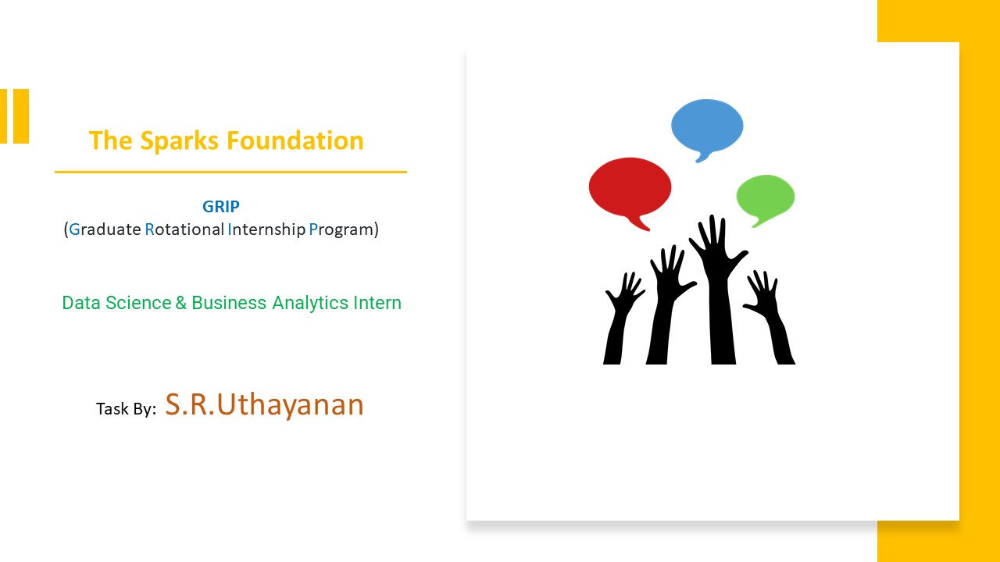

# Task-4: Exploratory Data Analysis on Global Terrorism

## Introduction

The Global Terrorism Database (GTD) is an open-source database including information on terrorist attacks around the world from 1970 through 2017. The GTD includes systematic data on domestic as well as international terrorist incidents that have occurred during this time period and now includes more than 180,000 attacks. The database is maintained by researchers at the National Consortium for the Study of Terrorism and Responses to Terrorism (START), headquartered at the University of Maryland.

## Problem Statement

- find out the hot zone of terrorism.

## Import Libraries

In [1]:
import numpy as np                     
import pandas as pd

pd.set_option('mode.chained_assignment', None)      
pd.set_option('display.max_colwidth', -1)           
pd.options.display.max_columns = 50  
pd.set_option('display.max_rows', None)

import warnings
warnings.filterwarnings('ignore')                  

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set(style='whitegrid', font_scale=1.3, color_codes=True)   

<ipython-input-1-c48b7aba859a>:5: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


## Import dataset

In [42]:
df = pd.read_csv('E:/TSF_Internship/globalterrorismdb_0718dist.csv',encoding='latin1')
df.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,region_txt,provstate,city,latitude,longitude,specificity,vicinity,location,summary,crit1,crit2,crit3,doubtterr,alternative,alternative_txt,...,nhostkid,nhostkidus,nhours,ndays,divert,kidhijcountry,ransom,ransomamt,ransomamtus,ransompaid,ransompaidus,ransomnote,hostkidoutcome,hostkidoutcome_txt,nreleased,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,Central America & Caribbean,NaN,Santo Domingo,18.456792,-69.951164,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,North America,Federal,Mexico city,19.371887,-99.086624,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,...,1.0,0.0,NaN,NaN,NaN,Mexico,1.0,800000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,Southeast Asia,Tarlac,Unknown,15.478598,120.599741,4.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,Western Europe,Attica,Athens,37.997490,23.762728,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,East Asia,Fukouka,Fukouka,33.580412,130.396361,1.0,0,NaN,NaN,1,1,1,-9.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


## Data Selection

- We have considered 13 out of 135 columns from the original for our analysis. 

In [43]:
data = df[['iyear','country_txt','region_txt','city','provstate','attacktype1_txt','suicide','targtype1_txt','latitude',
           'longitude','natlty1_txt','gname','weaptype1_txt','nkill','nwound']]

In [44]:
data.rename(columns={'iyear':'Year','country_txt':'Country', 'region_txt':'Region','city':'City','provstate':'State',
                       'attacktype1_txt':'Attacktype','suicide':'Suicide','targtype1_txt':'Targettype',
                       'natlty1_txt':'Nationality', 'gname':'Group', 'weaptype1_txt':'Weapon',
                       'nkill':'kill', 'nwound':'Wound'},inplace=True)

## Data Description

|Variables	    |Description
|:-----------   |:-------------------------------- |
|Year:          |This field contains the year in which the incident occurred.|
|Country:       |This field identifies the country or location where the incident occurred.|
|Region:        |This field identifies the region in which the incident occurred.|
|State:         |Name (at the time of event) of the 1st order subnational administrative region|
|City:          |Name of the city, village, or town in which the incident occurred|
|Suicide:       |1 = "Yes" The incident was a suicide attack. 0 = "No" There is no indication that the incident was a suicide|
|Attacktype:    |The general method of attack and broad class of tactics used.|
|Targtype:      |The general type of target/victim|
|Nationality:   |The nationality of the target that was attacked|
|Group:         |The name of the group that carried out the attack|
|Weapon:        |General type of weapon used in the incident|
|kill:          |The number of total confirmed fatalities for the incident|
|Wound:         |The number of total injured in that incident|

## Observations of Data

In [45]:
data.head()

,Year,Country,Region,City,State,Attacktype,Suicide,Targettype,latitude,longitude,Nationality,Group,Weapon,kill,Wound
0,1970,Dominican Republic,Central America & Caribbean,Santo Domingo,NaN,Assassination,0,Private Citizens & Property,18.456792,-69.951164,Dominican Republic,MANO-D,Unknown,1.0,0.0
1,1970,Mexico,North America,Mexico city,Federal,Hostage Taking (Kidnapping),0,Government (Diplomatic),19.371887,-99.086624,Belgium,23rd of September Communist League,Unknown,0.0,0.0
2,1970,Philippines,Southeast Asia,Unknown,Tarlac,Assassination,0,Journalists & Media,15.478598,120.599741,United States,Unknown,Unknown,1.0,0.0
3,1970,Greece,Western Europe,Athens,Attica,Bombing/Explosion,0,Government (Diplomatic),37.997490,23.762728,United States,Unknown,Explosives,NaN,NaN
4,1970,Japan,East Asia,Fukouka,Fukouka,Facility/Infrastructure Attack,0,Government (Diplomatic),33.580412,130.396361,United States,Unknown,Incendiary,NaN,NaN


In [46]:
data.shape

(181691, 15)

In [47]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 15 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Year         181691 non-null  int64  
 1   Country      181691 non-null  object 
 2   Region       181691 non-null  object 
 3   City         181257 non-null  object 
 4   State        181270 non-null  object 
 5   Attacktype   181691 non-null  object 
 6   Suicide      181691 non-null  int64  
 7   Targettype   181691 non-null  object 
 8   latitude     177135 non-null  float64
 9   longitude    177134 non-null  float64
 10  Nationality  180132 non-null  object 
 11  Group        181691 non-null  object 
 12  Weapon       181691 non-null  object 
 13  kill         171378 non-null  float64
 14  Wound        165380 non-null  float64
dtypes: float64(4), int64(2), object(9)
memory usage: 20.8+ MB


In [48]:
data.nunique()

Year           47   
Country        205  
Region         12   
City           36674
State          2855 
Attacktype     9    
Suicide        2    
Targettype     22   
latitude       48322
longitude      48039
Nationality    215  
Group          3537 
Weapon         12   
kill           205  
Wound          238  
dtype: int64

In [49]:
null_data = pd.DataFrame(data.isnull().sum(), columns = ['Frequency'])
null_data.transpose()

,Year,Country,Region,City,State,Attacktype,Suicide,Targettype,latitude,longitude,Nationality,Group,Weapon,kill,Wound
Frequency,0,0,0,434,421,0,0,0,4556,4557,1559,0,0,10313,16311


In [50]:
data.duplicated().sum()

27511

## Pre-processing of Data

### Removing Duplicates

In [51]:
data = data.drop_duplicates()

In [52]:
data.shape

(154180, 15)

### Missing Value Treatment

In [53]:
data.Weapon.value_counts()

Explosives                                                                     74110
Firearms                                                                       53348
Unknown                                                                        13957
Incendiary                                                                     8601 
Melee                                                                          3417 
Chemical                                                                       300  
Sabotage Equipment                                                             134  
Vehicle (not to include vehicle-borne explosives, i.e., car or truck bombs)    130  
Other                                                                          111  
Biological                                                                     34   
Fake Weapons                                                                   33   
Radiological                                                     

In [54]:
data['Weapon'] =data['Weapon'].apply(lambda x: x if x in ['Explosives','Firearms','Unknown','Incendiary'] else 'Others')

In [55]:
data.Attacktype.value_counts()

Bombing/Explosion                      70087
Armed Assault                          38714
Assassination                          17148
Hostage Taking (Kidnapping)            10599
Facility/Infrastructure Attack         8452 
Unknown                                6735 
Hostage Taking (Barricade Incident)    902  
Unarmed Assault                        899  
Hijacking                              644  
Name: Attacktype, dtype: int64

In [56]:
data['Attacktype'] = data['Attacktype'].apply(lambda x: x if x in ['Bombing/Explosion','Armed Assault','Assassination',
                                                        'Hostage Taking','Facility/Infrastructure Attack'] else 'Others')

## Exploratory Data Analysis

### Terrorist attacks in Year wise

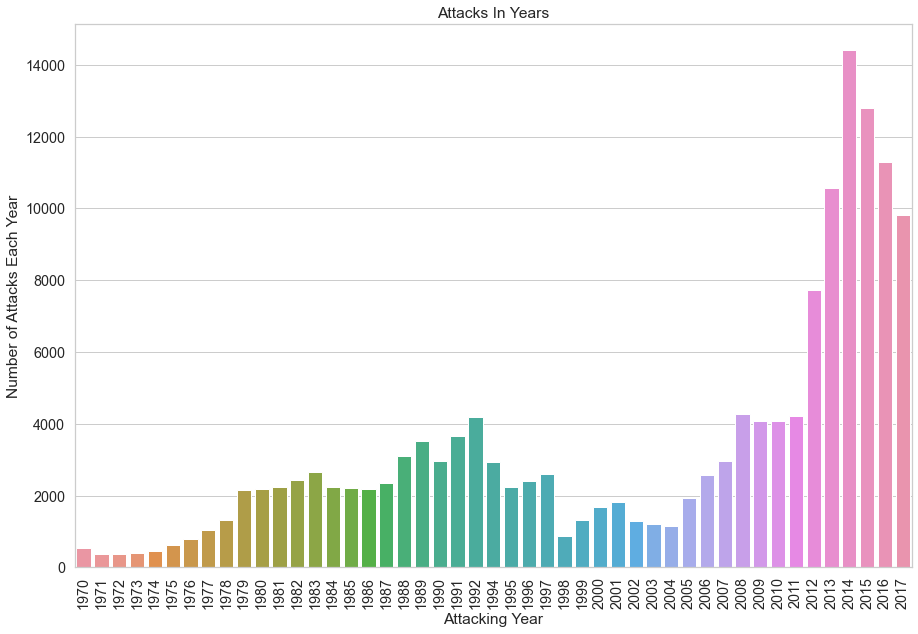

In [57]:
 year = data['Year'].unique()
years_count = data['Year'].value_counts(dropna = False).sort_index()
plt.figure(figsize = (15,10))
sns.barplot(x = year, y = years_count)
plt.xticks(rotation = 90)
plt.xlabel('Attacking Year')
plt.ylabel('Number of Attacks Each Year')
plt.title('Attacks In Years')
plt.show()

This graph show the number of global terrorist attacks and number of dead/injured people by year from 1970 to 2017. 

Overall, the number of attacks is increasing. The number of dead/injured people also increases respectively. 

The number of attack increased significantly from 2012 to 2015. 

### Countries Affected by terrorism

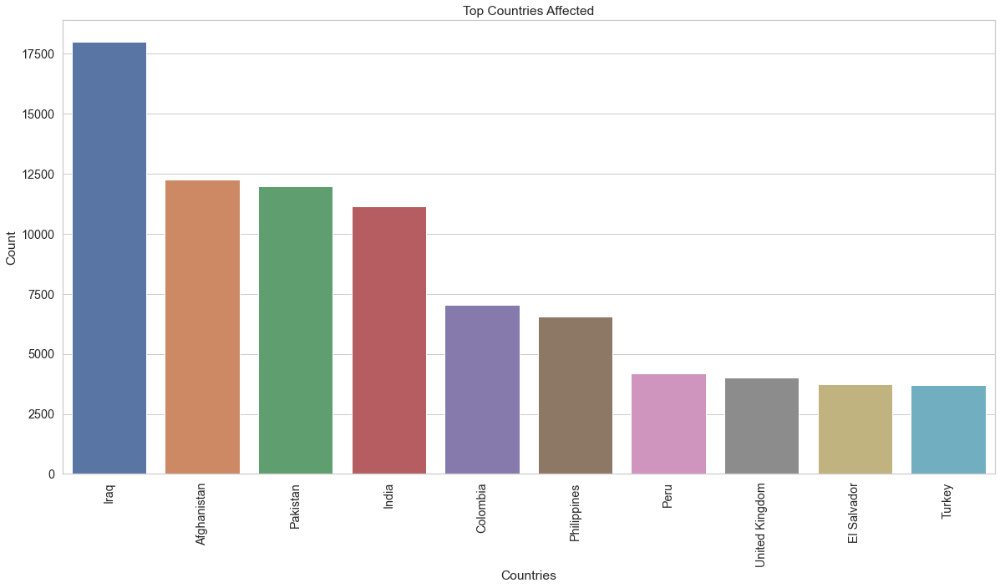

In [58]:
plt.subplots(figsize=(20,10))
sns.barplot(data['Country'].value_counts()[:10].index,data['Country'].value_counts()[:10].values)
plt.title('Top Countries Affected')
plt.xlabel('Countries')
plt.ylabel('Count')
plt.xticks(rotation = 90)
plt.show()

### cities Affected by Terrorism

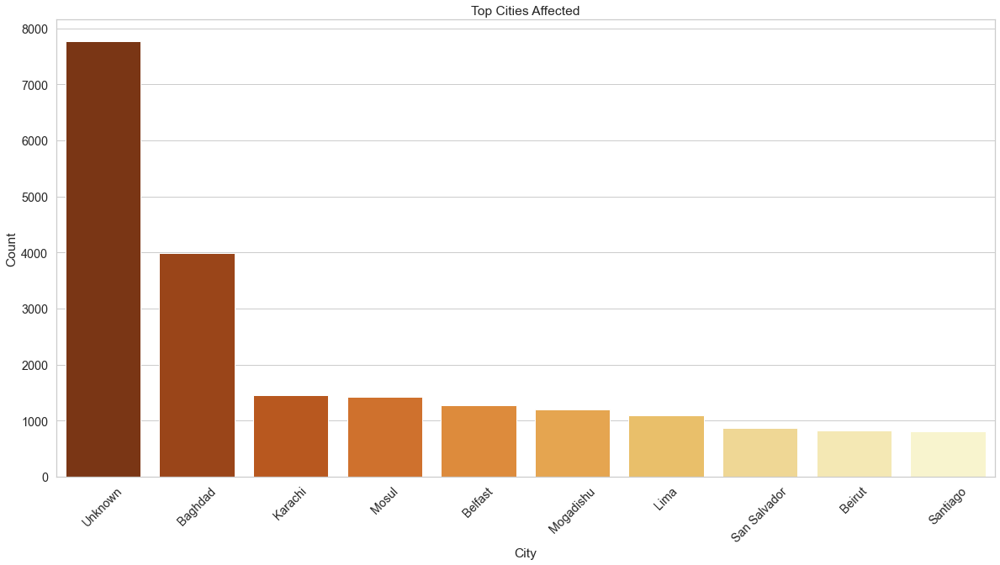

In [74]:
plt.subplots(figsize=(20,10))
sns.barplot(data['City'].value_counts()[:10].index,data['City'].value_counts()[:10].values,palette='YlOrBr_r')
plt.title('Top Cities Affected')
plt.xlabel('City')
plt.ylabel('Count')
plt.xticks(rotation = 45)
plt.show()

### Region wise Terror Attacks

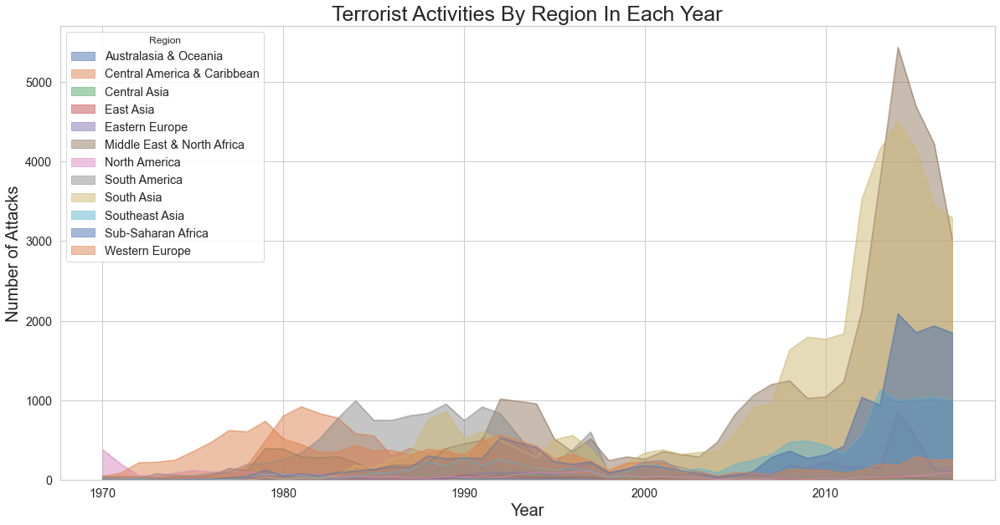

In [60]:
pd.crosstab(data.Year, data.Region).plot(kind='area',stacked=False,figsize=(20,10))
plt.title('Terrorist Activities By Region In Each Year',fontsize=25)
plt.ylabel('Number of Attacks',fontsize=20)
plt.xlabel("Year",fontsize=20)
plt.show()

### Type of Terror Attacks

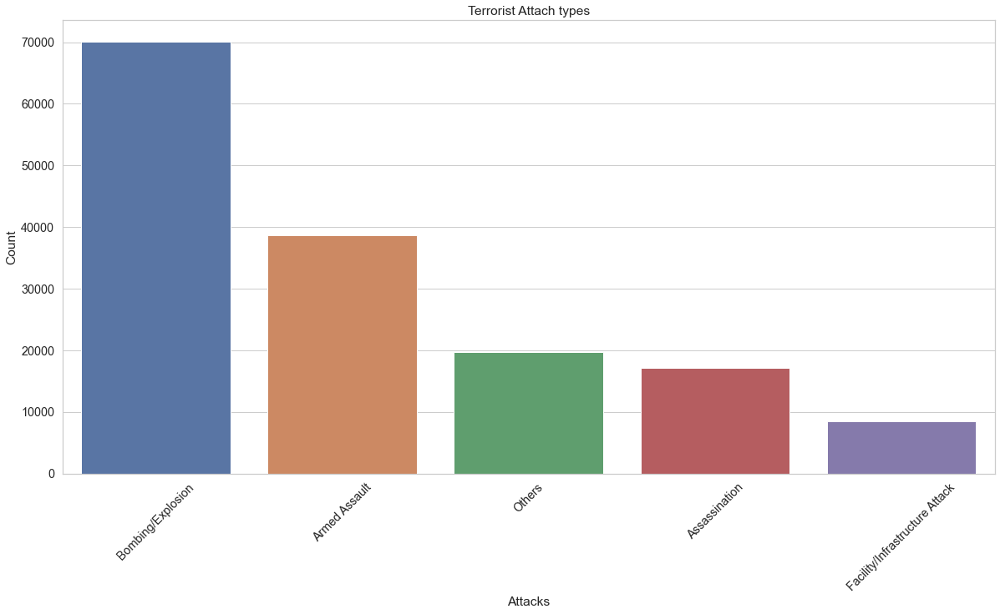

In [61]:
plt.subplots(figsize=(20,10))
sns.barplot(data['Attacktype'].value_counts()[:10].index,data['Attacktype'].value_counts()[:10].values)
plt.title('Terrorist Attack types')
plt.xlabel('Attacks')
plt.ylabel('Count')
plt.xticks(rotation = 45)
plt.show()

- The total number of dead/injured people caused by Bombing/Explosion is the highest

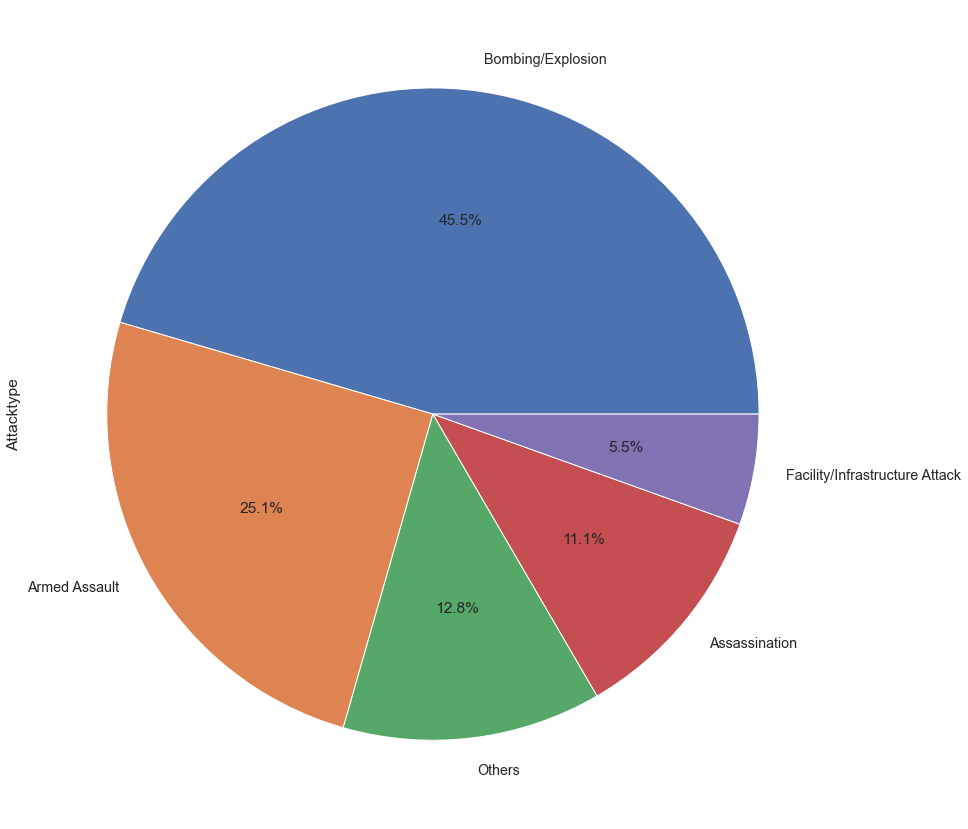

In [62]:
plt.figure(figsize=(15,15))
data['Attacktype'].value_counts().plot.pie(autopct="%1.1f%%")
plt.show()

### Targetted People by Terrerist Groups

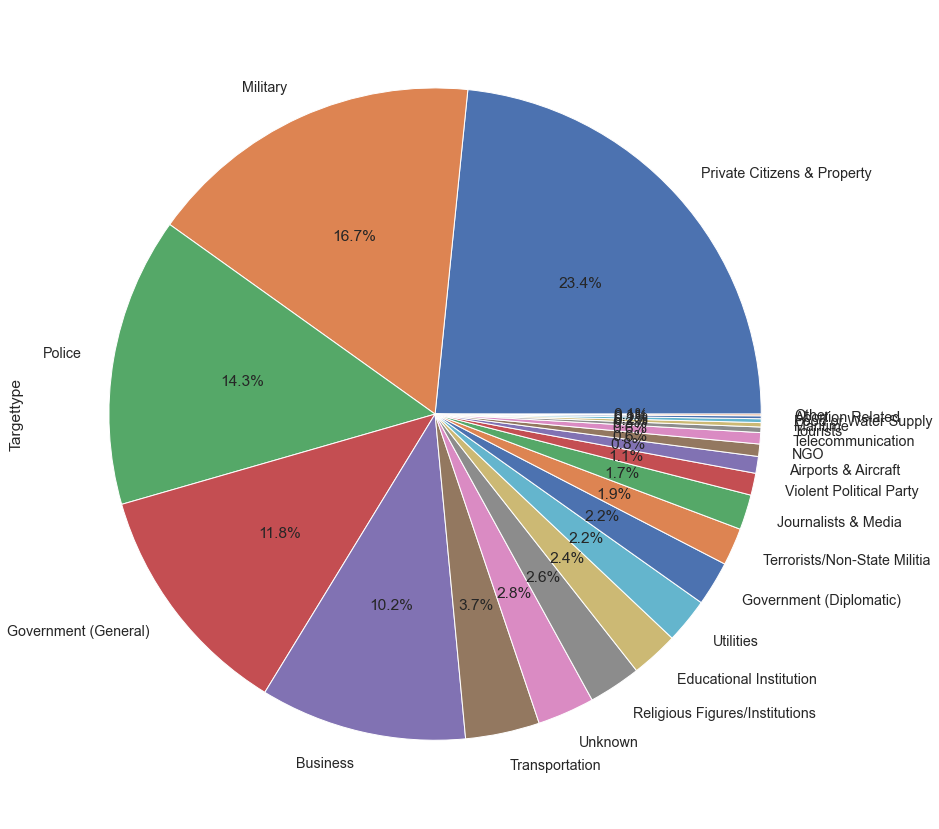

In [18]:
plt.figure(figsize=(15,15))
data['Targettype'].value_counts().plot.pie(autopct="%1.1f%%")
plt.show()

### Weapons User for Terror Attacks

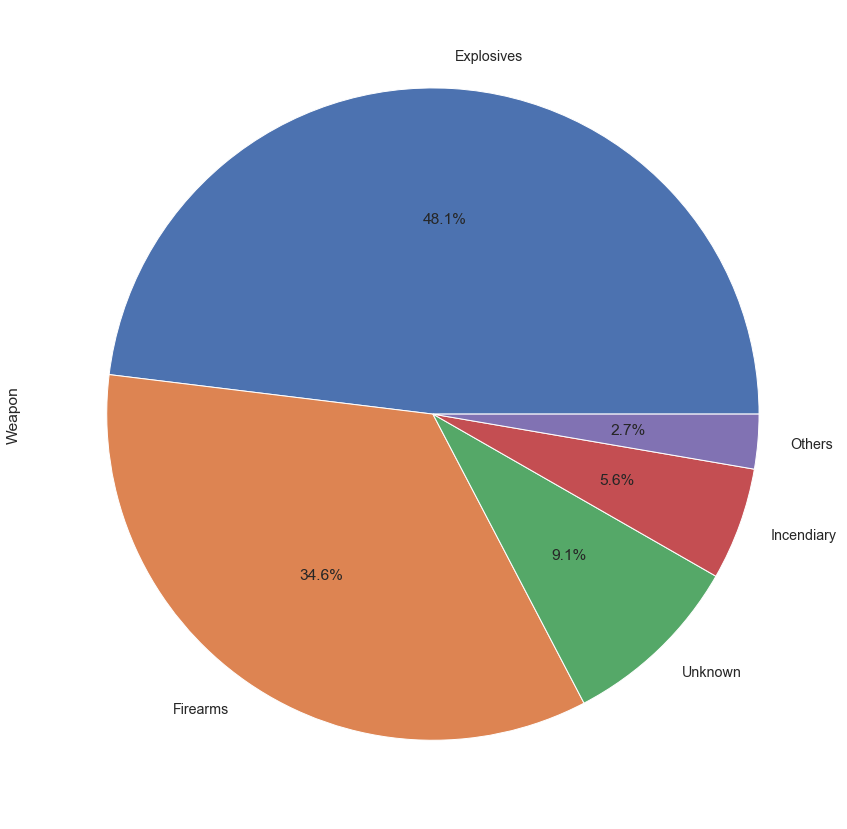

In [63]:
plt.figure(figsize=(15,15))
data['Weapon'].value_counts().plot.pie(autopct="%1.1f%%")
plt.show()

Explosives and Firearms are the two most popular choice of terrorist attacks.

### Year wise Number of People Killed / Injured by Terror Attacks

In [64]:
data.groupby(['Year'])['kill'].sum().sort_values(ascending = False).head(20)

Year
2014    42907.0
2015    36660.0
2016    32733.0
2017    25852.0
2013    21138.0
2012    14976.0
2007    12583.0
1984    10250.0
1997    10078.0
1992    9516.0 
1983    9397.0 
2006    9208.0 
2009    9033.0 
2008    8938.0 
1991    8324.0 
1989    7987.0 
2011    7776.0 
2001    7709.0 
2010    7577.0 
1994    7533.0 
Name: kill, dtype: float64

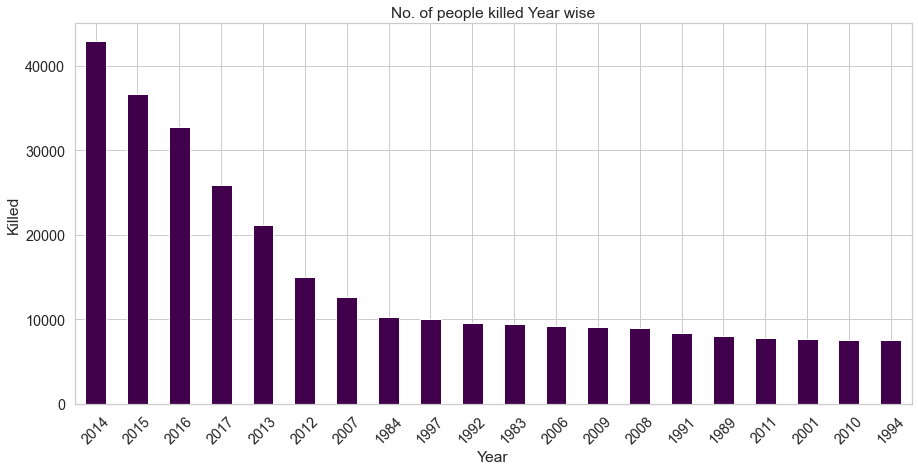

In [73]:
plt.figure(figsize = (15,7))
data.groupby(['Year'])['kill'].sum().sort_values(ascending = False).head(20).plot(kind = 'bar', colormap = 'PRGn')
plt.xticks(rotation=45)
plt.title('No. of people killed Year wise')
plt.ylabel("Killed")
plt.show()

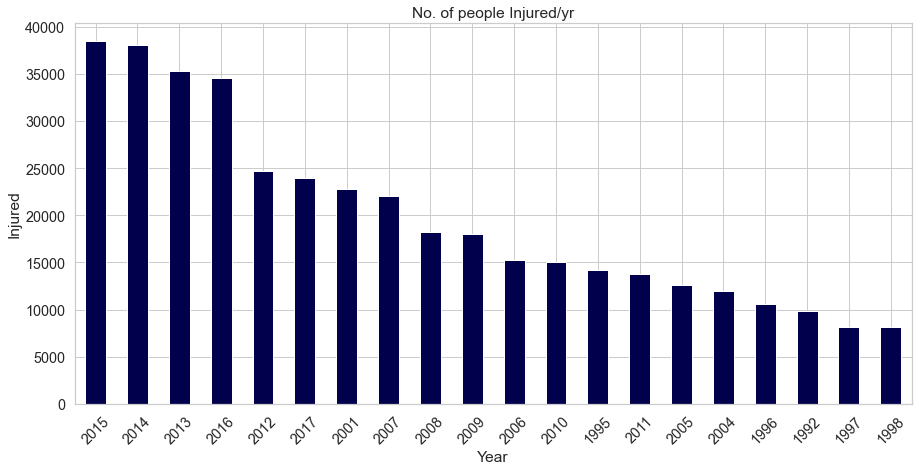

In [71]:
plt.figure(figsize = (15,7))
data.groupby(['Year'])['Wound'].sum().sort_values(ascending = False).head(20).plot(kind = 'bar', colormap = 'seismic')
plt.xticks(rotation=45)
plt.title('No. of people Injured/yr')
plt.ylabel("Injured")
plt.show()

###  Country wise People attacked by Terrorists

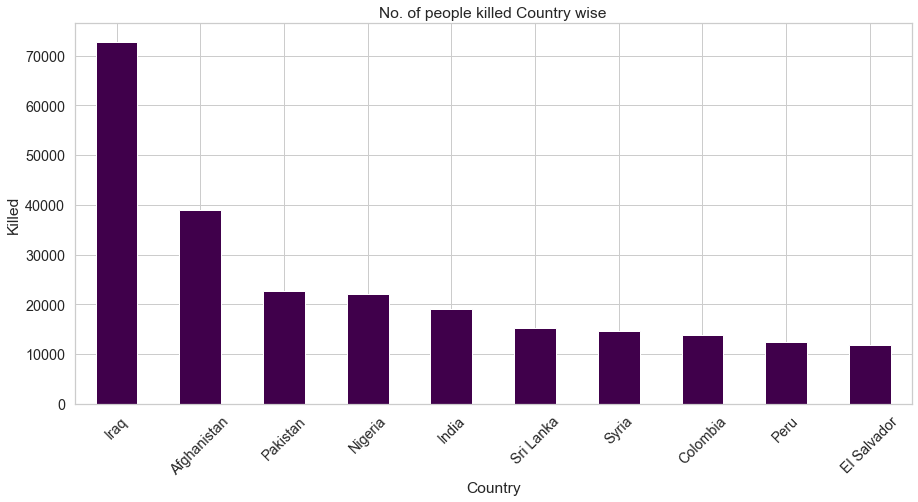

In [72]:
plt.figure(figsize = (15,7))
data.groupby(['Country'])['kill'].sum().sort_values(ascending = False).head(10).plot(kind = 'bar', colormap = 'PRGn')
plt.xticks(rotation=45)
plt.title('No. of people killed Country wise')
plt.ylabel("Killed")
plt.show()

### Region wise People attacked by Terrorists

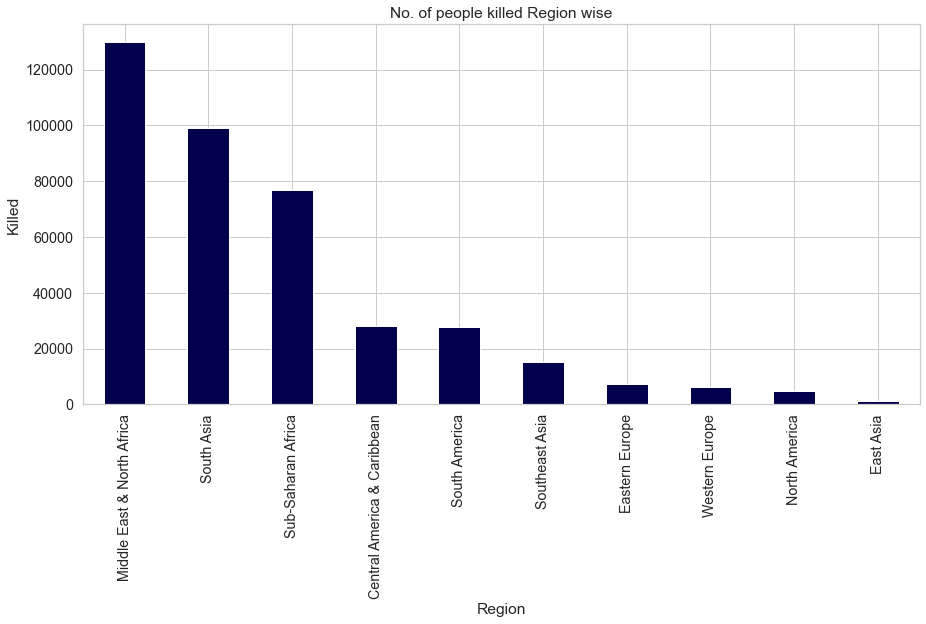

In [68]:
plt.figure(figsize = (15,7))
data.groupby(['Region'])['kill'].sum().sort_values(ascending = False).head(10).plot(kind = 'bar', colormap = 'seismic')
plt.xticks(rotation=90)
plt.title('No. of people killed Region wise')
plt.ylabel("Killed")
plt.show()

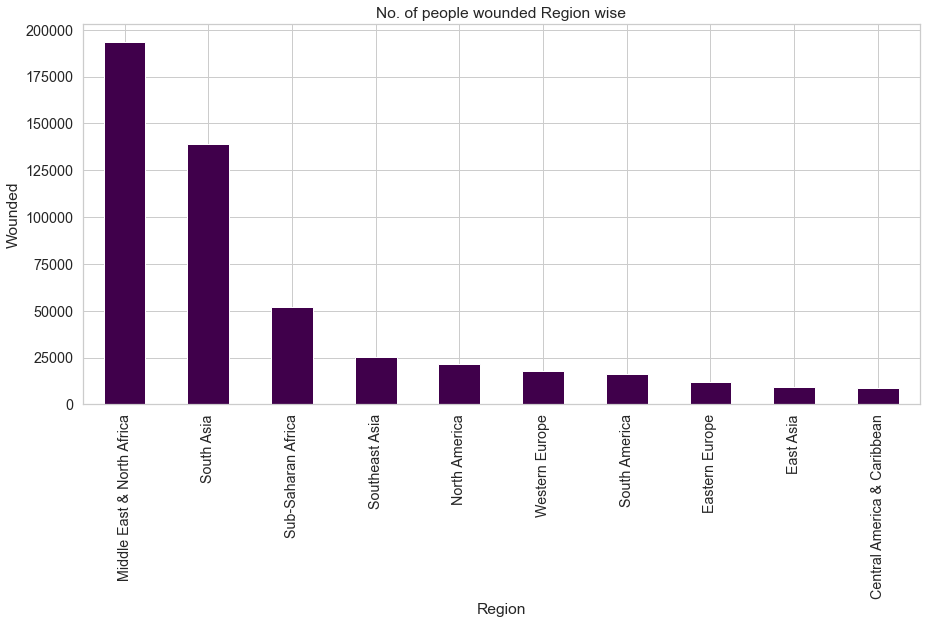

In [25]:
plt.figure(figsize = (15,7))
data.groupby(['Region'])['Wound'].sum().sort_values(ascending = False).head(10).plot(kind = 'bar', colormap = 'PRGn')
plt.xticks(rotation=90)
plt.title('No. of people wounded Region wise')
plt.ylabel("Wounded")
plt.show()

###  Nationality wise people attacked by Terrorists

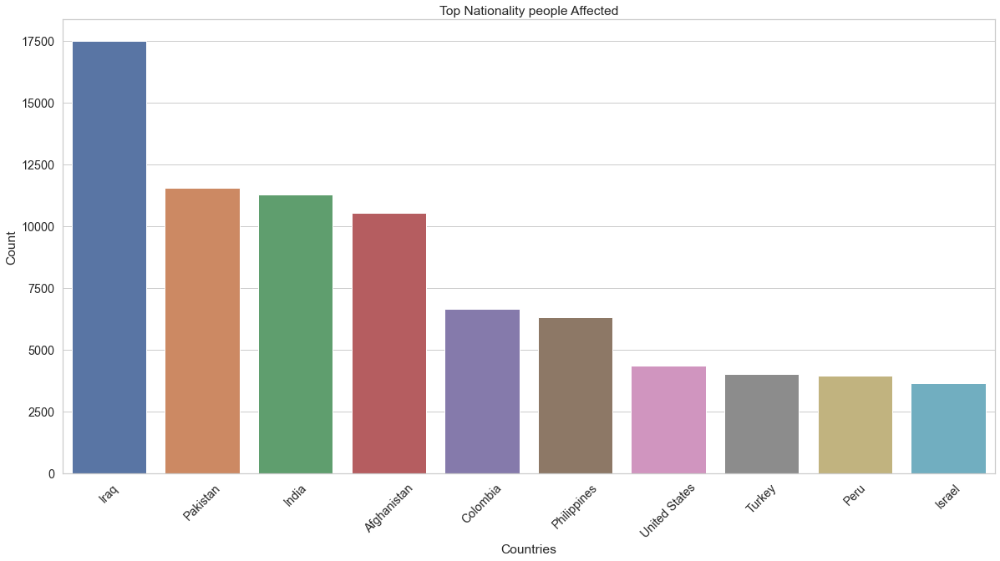

In [82]:
plt.subplots(figsize=(20,10))
sns.barplot(data['Nationality'].value_counts()[:10].index,data['Nationality'].value_counts()[:10].values)
plt.title('Top Nationality people Affected')
plt.xlabel('Countries')
plt.ylabel('Count')
plt.xticks(rotation = 45)
plt.show()

### Terrorist Organisation involved in Highest Terror Attacks

In [69]:
df2=data[['Group','Country','kill']]
df2=df2.groupby(['Group','Country'],axis=0).sum().sort_values('kill',ascending=False).drop('Unknown').reset_index().head(10)
df2

,Group,Country,kill
0,Islamic State of Iraq and the Levant (ISIL),Iraq,30157.0
1,Taliban,Afghanistan,28889.0
2,Boko Haram,Nigeria,16492.0
3,Shining Path (SL),Peru,11237.0
4,Liberation Tigers of Tamil Eelam (LTTE),Sri Lanka,10740.0
5,Farabundo Marti National Liberation Front (FMLN),El Salvador,7905.0
6,Al-Shabaab,Somalia,7869.0
7,Islamic State of Iraq and the Levant (ISIL),Syria,6685.0
8,Nicaraguan Democratic Force (FDN),Nicaragua,6573.0
9,Tehrik-i-Taliban Pakistan (TTP),Pakistan,5985.0


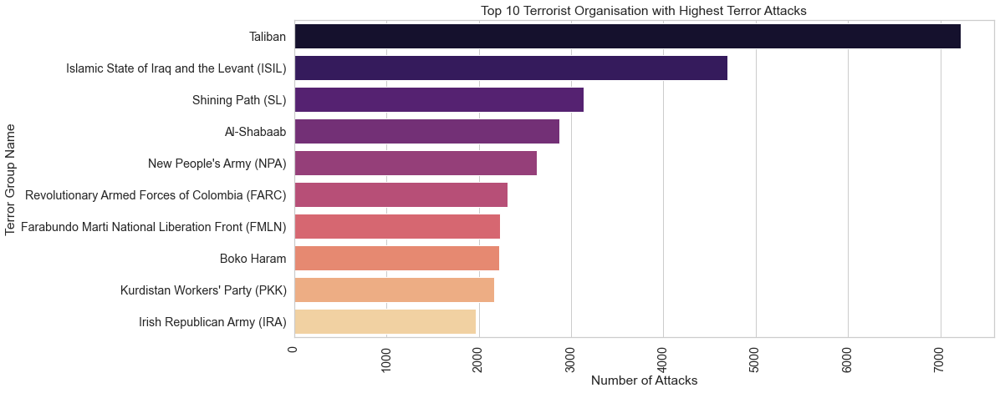

In [70]:
plt.figure(figsize = (15,7))
sns.barplot(x = data['Group'].value_counts()[1:11].values, y = data['Group'].value_counts()[1:11].index,palette='magma')
plt.title('Top 10 Terrorist Organisation with Highest Terror Attacks')
plt.ylabel('Terror Group Name')
plt.xlabel('Number of Attacks')
plt.xticks(rotation= 90)
plt.show()

###  Plotting the Locations of the Terrorist Attacks

In [29]:
import folium
from folium.plugins import MarkerCluster

In [30]:
filterYr = data["Year"] == 2015

In [31]:
filterData = data[filterYr]
reqFields = filterData.loc[:,"City":"longitude"]
reqFields = reqFields.dropna()
reqFieldsLst = reqFields.values.tolist()

#### Plotting on Map

In [34]:
map = folium.Map(location=[38,25],tiles="CartoDB positron", zoom_start=2)

markerCluster = folium.plugins.MarkerCluster().add_to(map)
 
for point in range(len(reqFieldsLst)):
    folium.Marker(location=[reqFieldsLst[point][-2],reqFieldsLst[point][-1]],
                            popup=reqFieldsLst[point][0]).add_to(markerCluster)    
map

## Global Terrorism for Last 10 years of Data collected  (2008 to 2017)

### Top 10 countries with the highest Number Attacks

In [76]:
data_last10 = data[data['Year'] > 2007]

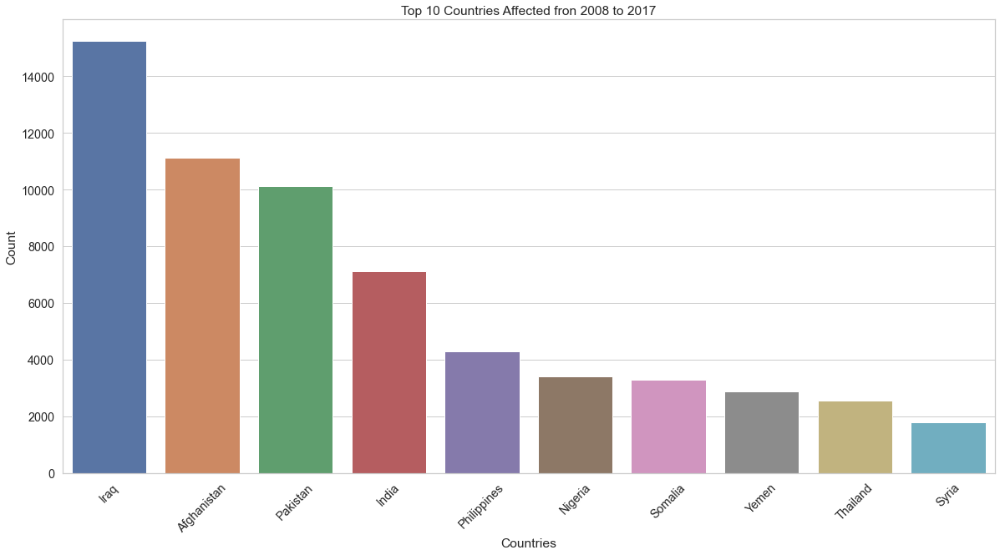

In [80]:
plt.subplots(figsize=(20,10))
sns.barplot(data_last10['Country'].value_counts()[:10].index,data_last10['Country'].value_counts()[:10].values)
plt.title('Top 10 Countries Affected fron 2008 to 2017')
plt.xlabel('Countries')
plt.ylabel('Count')
plt.xticks(rotation = 45)
plt.show()

### Top 10 Targeted Nationalities by Terrorist Groups

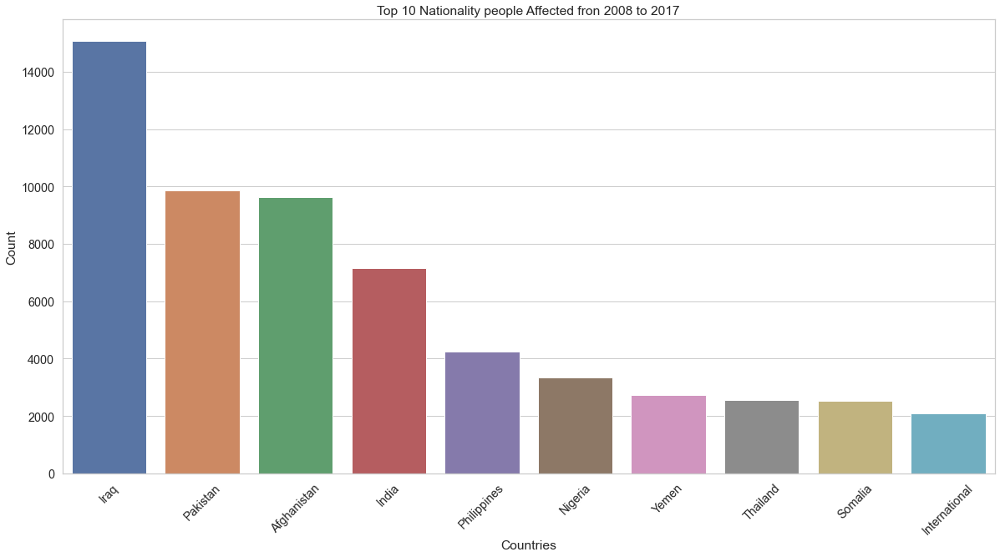

In [81]:
plt.subplots(figsize=(20,10))
sns.barplot(data_last10['Nationality'].value_counts()[:10].index,data_last10['Nationality'].value_counts()[:10].values)
plt.title('Top 10 Nationality people Affected fron 2008 to 2017')
plt.xlabel('Countries')
plt.ylabel('Count')
plt.xticks(rotation = 45)
plt.show()

### The Safest Countries from 2008 to 2017 (Injury / Death is Nil)

In [94]:
data['Damage']=data['kill']+data['Wound']

In [95]:
country_damage = data[data['Year'] > 2008][["Country", "Damage"]].groupby('Country',as_index=False).sum()

In [96]:
country_damage[country_damage["Damage"]==0]

,Country,Damage
9,Bahamas,0.0
14,Belize,0.0
22,Cambodia,0.0
31,Cyprus,0.0
53,Guyana,0.0
54,Haiti,0.0
57,Iceland,0.0
75,Latvia,0.0
78,Liberia,0.0
82,Malawi,0.0


## Inferences and Conclusion

- Terrorist Organisation involved in Highest Terror Attacks: __Taliban__
- Region wise People attacked by Terrorists: __Middle East & North Africa__
- Country wise People attacked by Terrorists: __Iraq__
- Year with the most attacks: __2014__
- The total number of dead/injured people caused by Bombing/Explosion is the highest
- The number of attack increased significantly from 2012 to 2015.
- City the most affected by Terror attacks: __Baghdad__